In [4]:
import folium
from folium import plugins
import psycopg2
import csv
import pandas as pd
from area import area
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import json
%matplotlib inline
plt.style.use('seaborn-deep')

In [5]:
print(plt.style.available)

['seaborn-poster', 'bmh', 'seaborn-bright', 'classic', 'ggplot', 'seaborn-colorblind', 'seaborn-pastel', 'seaborn-white', 'seaborn-dark-palette', 'seaborn-dark', 'seaborn-muted', 'fivethirtyeight', 'seaborn-notebook', 'dark_background', 'seaborn-talk', 'seaborn-deep', 'seaborn-paper', 'seaborn-ticks', 'seaborn-darkgrid', 'grayscale', 'seaborn-whitegrid']


In [6]:
conn = psycopg2.connect(dbname="postgres", user="postgres" , password="root")

In [7]:
cursor = conn.cursor()

In [8]:
"""
This is a POSTGIS query, which has to be initiated only once, to get all postgis parameter present to your current database
"""

#cursor.execute("CREATE EXTENSION postgis;")

'\nThis is a POSTGIS query, which has to be initiated only once, to get all postgis parameter present to your current database\n'

In [9]:
conn.commit()

In [10]:
cursor.execute("DROP TABLE IF EXISTS crime_prior")

In [11]:
conn.commit()

In [12]:
cursor.execute("""CREATE TABLE crime_prior(ID INTEGER,
               CaseNo TEXT,
               DATE_OF_OCCURRENCE timestamp,
               BLOCK TEXT,
               IUCR TEXT,
               PRIMARY_TYPE TEXT, 
               DESCRIPTION TEXT, 
               LOCATION_DESCRIPTION TEXT,
               ARREST BOOLEAN,
               DOMESTIC BOOLEAN,
               BEAT INTEGER,
               DISTRICT INTEGER,
               WARD INTEGER,
               FBI_CD TEXT,
               YEAR INTEGER, 
               LATITUDE FLOAT, 
               LONGITUDE FLOAT, 
               Where_IS GEOGRAPHY);""")

In [13]:
with open('crime_2018.csv', 'r') as f:
    reader = csv.reader(f)
    next(reader)  # Skip the header row.
    i=0
    for row in reader:
        i=i+1
        cursor.execute(
            "INSERT INTO crime_prior VALUES (%s, %s, %s, %s,%s, %s, %s,%s, %s, %s, %s,%s, %s,%s,%s,%s,%s, NULL)",
            row
            
        )

In [14]:
conn.commit()

In [15]:
cursor.execute("DROP TABLE IF EXISTS crime_police")

In [16]:
conn.commit()

In [17]:
cursor.execute("""CREATE TABLE crime_police(District TEXT,
               Address TEXT,
               City TEXT,
               State TEXT,
               ZIP INTEGER, 
               LATITUDE FLOAT,
               LONGITUDE FLOAT, 
               Where_IS GEOGRAPHY);""")

In [18]:
with open('ChicagoPoliceStation.csv', 'r') as f:
    reader = csv.reader(f)
    next(reader)  # Skip the header row.
    for row in reader:
        cursor.execute(
            "INSERT INTO crime_police VALUES (%s, %s, %s, %s,%s,%s,%s,NULL)",
            row
        )

In [19]:
cursor.execute("UPDATE crime_police SET Where_IS = ST_POINT(LATITUDE,LONGITUDE);")

In [20]:
conn.commit()

In [21]:
cursor.execute("UPDATE crime_prior SET Where_IS = ST_POINT(LATITUDE,LONGITUDE);")

In [22]:
conn.commit()

In [23]:
cursor.execute("""SELECT DISTINCT ON (crime.Where_IS) crime.Where_IS, police.Where_IS, ST_Distance(crime.Where_IS,police.Where_IS) as dist
FROM crime_prior As crime, crime_police As police
ORDER BY crime.Where_IS, ST_Distance(crime.Where_IS,police.Where_IS), police.Where_IS;""")
conn.commit()
rows = cursor.fetchall()
cursor.execute("DROP TABLE IF EXISTS nearest_police")
conn.commit()
cursor.execute("create table nearest_police(crime geography, police geography, nearest_distance double precision)")
conn.commit()
for row in rows:
        cursor.execute(
            "INSERT INTO nearest_police VALUES (%s, %s, %s)",
            row
        )
conn.commit()

In [24]:
cursor.execute("""SELECT DISTINCT ON (crime.Where_IS) crime.Where_IS, police.Where_IS, ST_Distance(crime.Where_IS,police.Where_IS) as dist
FROM crime_prior As crime, crime_police As police
ORDER BY crime.Where_IS, ST_Distance(crime.Where_IS,police.Where_IS), police.Where_IS;""")

In [25]:
conn.commit()

In [26]:
rows = cursor.fetchall()

In [27]:
cursor.execute("DROP TABLE IF EXISTS nearest_police")
conn.commit()

In [28]:
cursor.execute("create table nearest_police(crime geography, police geography, nearest_distance double precision)")
conn.commit()

In [29]:
for row in rows:
        cursor.execute(
            "INSERT INTO nearest_police VALUES (%s, %s, %s)",
            row
        )

In [30]:
conn.commit()

In [31]:
cursor.execute("""SELECT B.WHERE_IS, A. police, A.nearest_distance FROM nearest_police as A JOIN crime_prior as B ON B.Where_IS = A.crime;""")

In [32]:
conn.commit()

In [33]:
"""rows=cursor.fetchall()
print("Crime Location \t\t\t\t\t\t Nearest Police Station \t\t\t\t Distance")
for row in rows:
    print(row)"""

'rows=cursor.fetchall()\nprint("Crime Location \t\t\t\t\t\t Nearest Police Station \t\t\t\t Distance")\nfor row in rows:\n    print(row)'

In [34]:
cursor.execute("""SELECT crime.Where_IS, police.Where_IS
FROM crime_prior As crime, crime_police As police
WHERE ST_DWithin(crime.Where_IS,police.Where_IS, 3609.34)
ORDER BY crime.Where_IS <-> police.Where_IS;""")

In [35]:
conn.commit()

In [36]:
rows = cursor.fetchall()
cursor.execute("DROP TABLE IF EXISTS police_within_mile")
conn.commit()

In [37]:
cursor.execute("create table police_within_mile(crime geography, police geography, police_c geography)")
conn.commit()

In [38]:
for row in rows:
        cursor.execute(
            "INSERT INTO police_within_mile VALUES (%s, %s, NULL)",
            row
        )

In [39]:
conn.commit()

In [40]:
cursor.execute("""SELECT crime, array_agg(police) AS p
    FROM police_within_mile
    GROUP BY crime;""")

In [41]:
conn.commit()
rows = cursor.fetchall()

In [42]:
"""for row in rows:
    print(row)"""

'for row in rows:\n    print(row)'

In [43]:
m= folium.Map([41.8781, -87.6298],zoom_start=11)

In [44]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)) from crime_police""")

In [45]:
rows=cursor.fetchall()

In [46]:
for row in rows:
    folium.CircleMarker(row,radius=5,fill_color="#3db7e4", popup ="Police Station").add_to(m) 

In [47]:
cursor.execute("""SELECT ST_X(ST_AsText(crime)), ST_Y(ST_AsText(crime)) from police_within_mile""")

In [48]:
rows=cursor.fetchall()

In [49]:
m.add_child(plugins.HeatMap(rows, radius=15))

In [50]:
cursor.execute("SELECT district, count(district) from crime_prior GROUP BY district")
rows=cursor.fetchall()

In [51]:
new_data=pd.DataFrame(rows, columns=['dist_num','number_of_crime'])
new_data['dist_num'] = new_data['dist_num'].astype(str)
new_data

,dist_num,number_of_crime
0,14,162
1,25,246
2,8,308
3,17,161
4,12,267
5,1,302
6,15,215
7,10,237
8,11,374
9,18,252


In [52]:
m1= folium.Map(location =(41.8781, -87.6298),zoom_start=11)

In [53]:
m1.choropleth(geo_data="Boundaries.geojson", 
              fill_color='OrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              data = new_data,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'number_of_crime']
              )
conn.commit()

In [54]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), district from crime_police""")
rows=cursor.fetchall()
conn.commit()
for row in rows:
    x=(row[0],row[1])
    cursor.execute("SELECT district, count(district) from crime_prior where district= %s GROUP BY district",[row[2]])
    data=cursor.fetchall()
    conn.commit()
    for a in data:
        folium.Marker(location=x,popup=folium.Popup(html="District No: %s, Number of crime:%s" %a ,max_width=450)).add_to(m1)
conn.commit()

In [55]:
m1

In [56]:
violent_crime='THEFT','ASSAULT','ROBBERY','KIDNAPPING','CRIM SEXUAL ASSAULT','BATTERY','MURDER'

In [57]:
cursor.execute("SELECT district, count(district) from crime_prior where PRIMARY_TYPE in %s GROUP BY district",[violent_crime])
rows=cursor.fetchall()
violent_crime_data=pd.DataFrame(rows, columns=['dist_num','violent_crime'])
violent_crime_data['dist_num'] = violent_crime_data['dist_num'].astype(str)
violent_crime_data

,dist_num,violent_crime
0,14,88
1,25,124
2,8,168
3,12,156
4,17,107
5,1,203
6,15,102
7,10,101
8,3,116
9,11,162


In [58]:
m2= folium.Map(location =(41.8781, -87.6298),zoom_start=11)
m2.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrRd', 
              fill_opacity=0.5, 
              line_opacity=1,
              data = violent_crime_data,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'violent_crime'],
              legend_name="VOILENT CRIME MAP"
              )
conn.commit()

In [59]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), district from crime_police""")
rows=cursor.fetchall()
conn.commit()
for row in rows:
    x=(row[0],row[1])
    cursor.execute("SELECT PRIMARY_TYPE, count(PRIMARY_TYPE) from crime_prior where district =%s AND PRIMARY_TYPE in %s GROUP BY PRIMARY_TYPE",[row[2],violent_crime])
    data=cursor.fetchall()
    vdf=pd.DataFrame(data, columns=['Description', 'Number of Violent Crime'])
    h1 = vdf.to_html(classes='table table-striped table-hover table-condensed table-responsive')
    folium.Marker(location=x,popup=folium.Popup(html="District No: %s Violent_Crime %s" %(row[2],h1))).add_to(m2)
    
conn.commit()

In [60]:
m2

In [61]:
gun='%GUN%'
cursor.execute("SELECT district, count(district) from crime_prior where DESCRIPTION::text LIKE %s GROUP BY district",[gun])
rows=cursor.fetchall()
gun_crime_data=pd.DataFrame(rows, columns=['dist_num','gun_crime'])
gun_crime_data['dist_num'] = gun_crime_data['dist_num'].astype(str)
gun_crime_data

,dist_num,gun_crime
0,14,1
1,25,13
2,8,18
3,17,19
4,12,4
5,1,6
6,15,10
7,10,15
8,3,16
9,11,21


In [62]:
m3= folium.Map(location =(41.8781, -87.6298),zoom_start=11)
m3.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrBr', 
              fill_opacity=0.5, 
              line_opacity=1,
              data = gun_crime_data,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crime'],
              legend_name="GUN CRIME"
              )
conn.commit()

In [63]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), district from crime_police""")
gun='%GUN%'
rows=cursor.fetchall()
conn.commit()
for row in rows:
    x=(row[0],row[1])
    cursor.execute("""SELECT DESCRIPTION, count(DESCRIPTION) from crime_prior where district=%s and DESCRIPTION::text LIKE %s GROUP BY DESCRIPTION""",[row[2],gun])
    data=cursor.fetchall()
    vdf=pd.DataFrame(data, columns=['Description', 'Number of Gun Crime'])
    h1 = vdf.to_html(classes='table table-striped table-hover table-condensed table-responsive')
    folium.Marker(location=x,popup=folium.Popup(html="District No: %s GUN_Crime: %s" %(row[2],h1) )).add_to(m3)
    
conn.commit()

In [64]:
m3

In [65]:
district=[]
tarea=[]

with open('Boundaries.geojson') as f:
    data = json.load(f)
    a = data['features']
    for i in range(len(a)):
        obj=a[i]['geometry']
        n= a[i]['properties']
        district.append(n['dist_num'])
        tarea.append(area(obj)/10000)

af=pd.DataFrame({'dist_num': district,'district_area_inHectares':tarea})
af['dist_num'] = af['dist_num'].astype(str)
final_data= pd.merge(af, new_data, on='dist_num', how='inner')
final_data['crime_density'] = round(final_data['number_of_crime']/(final_data['district_area_inHectares']/100))
final_data

,dist_num,district_area_inHectares,number_of_crime,crime_density
0,17,2492.727155,161,6.0
1,20,1132.170216,87,8.0
2,19,2225.035732,248,11.0
3,25,2827.989237,246,9.0
4,14,1555.869965,162,10.0
5,7,1688.670732,290,17.0
6,3,1576.063931,234,15.0
7,4,7068.152865,280,4.0
8,6,2099.682124,307,15.0
9,22,3490.416073,179,5.0


In [66]:
m4= folium.Map(location =(41.8781, -87.6298),zoom_start=11)
m4.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrBr', 
              fill_opacity=0.5, 
              line_opacity=1,
              data = gun_crime_data,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crime'],
              legend_name="GUN CRIME"
              )
conn.commit()

In [67]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), district from crime_police""")
gun='%GUN%'
rows=cursor.fetchall()
conn.commit()
marker_cluster = MarkerCluster().add_to(m4)
for row in rows:
    x=(row[0],row[1])
    cursor.execute("""SELECT DISTINCT ON(caseno) caseno, block,DESCRIPTION, count(arrest), arrest,latitude, longitude from crime_prior where district=%s and DESCRIPTION::text LIKE %s GROUP BY caseno,block, DESCRIPTION,arrest, latitude, longitude""",[row[2],gun])
    r=cursor.fetchall()
    for rw in r:
        if rw[4]==True:
            folium.Marker(location=(rw[5],rw[6]),popup=folium.Popup(html="District No: %s <br> Description: %s <br> Block: %s" %(row[2],rw[2],rw[1])),icon=folium.Icon(color='green', icon='ok-sign'),).add_to(marker_cluster)
        else:
            folium.Marker(location=(rw[5],rw[6]),popup=folium.Popup(html="District No: %s <br> Description: %s<br> Block: %s" %(row[2],rw[2],rw[1])),icon=folium.Icon(color='red', icon='remove-sign'),).add_to(marker_cluster)
            
            
conn.commit()

In [68]:
m4

In [69]:
m5= folium.Map(location =(41.8781, -87.6298),zoom_start=11)
m5.choropleth(geo_data="Boundaries.geojson", 
              fill_color='YlOrBr', 
              fill_opacity=0.5, 
              line_opacity=1,
              data = gun_crime_data,
              key_on='feature.properties.dist_num',
              columns = ['dist_num', 'gun_crime'],
              legend_name="GUN CRIME"
              )
conn.commit()

In [70]:
cursor.execute("""SELECT ST_X(ST_AsText(Where_IS)), ST_Y(ST_AsText(Where_IS)), district from crime_police""")
rows=cursor.fetchall()
conn.commit()
gun='%GUN%'
for row in rows:
    cursor.execute("""SELECT DISTINCT on (A.block) A.district,A.block, A.where_is,ST_Distance(A.where_is,B.where_is) from crime_prior as A, crime_police as B 
    where ST_Distance(A.where_is,B.where_is) in ( SELECT max(dist) FROM 
    (SELECT ST_Distance(A.where_is,B.where_is) as dist from crime_prior as A, crime_police as B where A.district=%s 
    and DESCRIPTION::text LIKE %s and B.district= %s ) as f)""",[row[2],gun,row[2]])
    r=cursor.fetchall()
    conn.commit()
    cursor.execute("SELECT ST_X(ST_AsText(%s)), ST_Y(ST_AsText(%s))",(r[0][2],r[0][2]))
    location=cursor.fetchall()
    folium.Marker(location=(row[0],row[1]),popup=folium.Popup(html="Police Station <br> District No.:%s <br> Farthest Gun_Crime Block:%s"%(r[0][0],r[0][1]))).add_to(m5)
    folium.CircleMarker(location[0],radius=5,color='#ff3187',popup=folium.Popup(html="District No.:%s <br> Block:%s"%(r[0][0],r[0][1]))).add_to(m5) 
    conn.commit()
    
conn.commit()

In [71]:
m5

In [72]:
cursor.execute("""SELECT PRIMARY_TYPE FROM crime_prior """)

In [73]:
types_crimes=cursor.fetchall()
conn.commit()

In [74]:
tc=pd.DataFrame(types_crimes, columns=["type"])

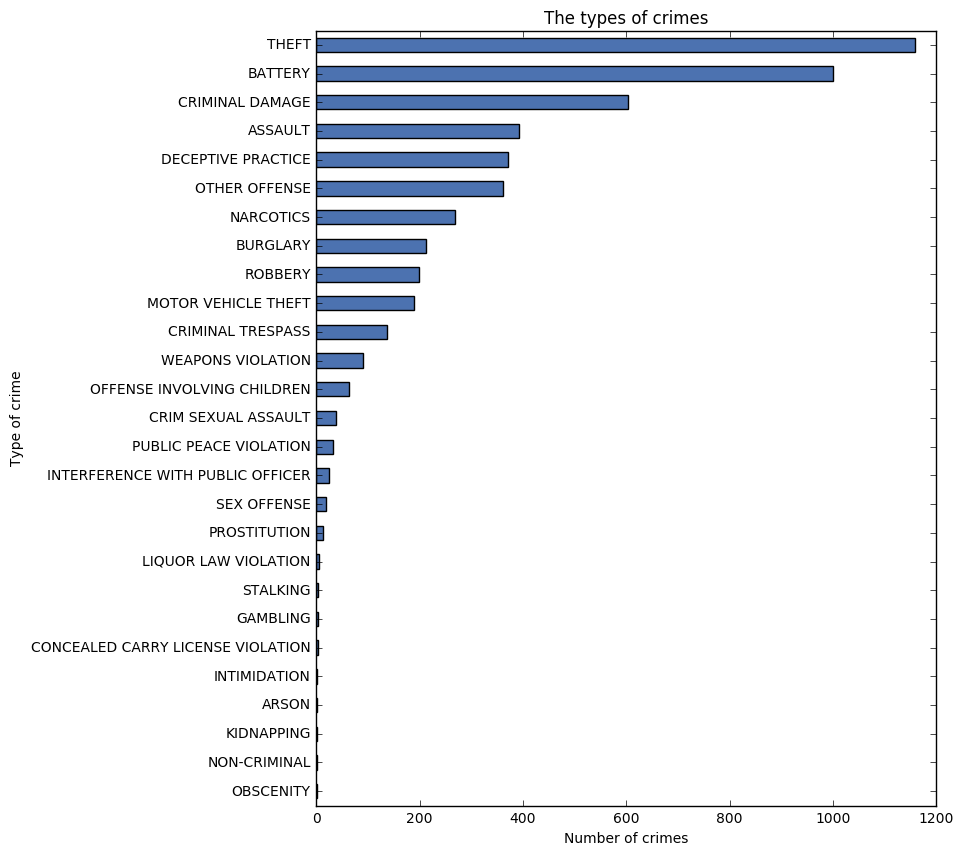

In [75]:
plt.figure(figsize=(8,10))
tc.groupby([tc['type']]).size().sort_values(ascending=True).plot(kind='barh')
plt.title('The types of crimes')
plt.ylabel('Type of crime')
plt.xlabel('Number of crimes') 
plt.show() 

In [76]:
tc.groupby([tc['type']]).size().sort_values(ascending=True)

type
OBSCENITY                               1
NON-CRIMINAL                            1
KIDNAPPING                              1
ARSON                                   2
INTIMIDATION                            2
CONCEALED CARRY LICENSE VIOLATION       3
GAMBLING                                3
STALKING                                4
LIQUOR LAW VIOLATION                    6
PROSTITUTION                           13
SEX OFFENSE                            18
INTERFERENCE WITH PUBLIC OFFICER       24
PUBLIC PEACE VIOLATION                 32
CRIM SEXUAL ASSAULT                    39
OFFENSE INVOLVING CHILDREN             64
WEAPONS VIOLATION                      90
CRIMINAL TRESPASS                     136
MOTOR VEHICLE THEFT                   190
ROBBERY                               199
BURGLARY                              213
NARCOTICS                             269
OTHER OFFENSE                         362
DECEPTIVE PRACTICE                    371
ASSAULT                      

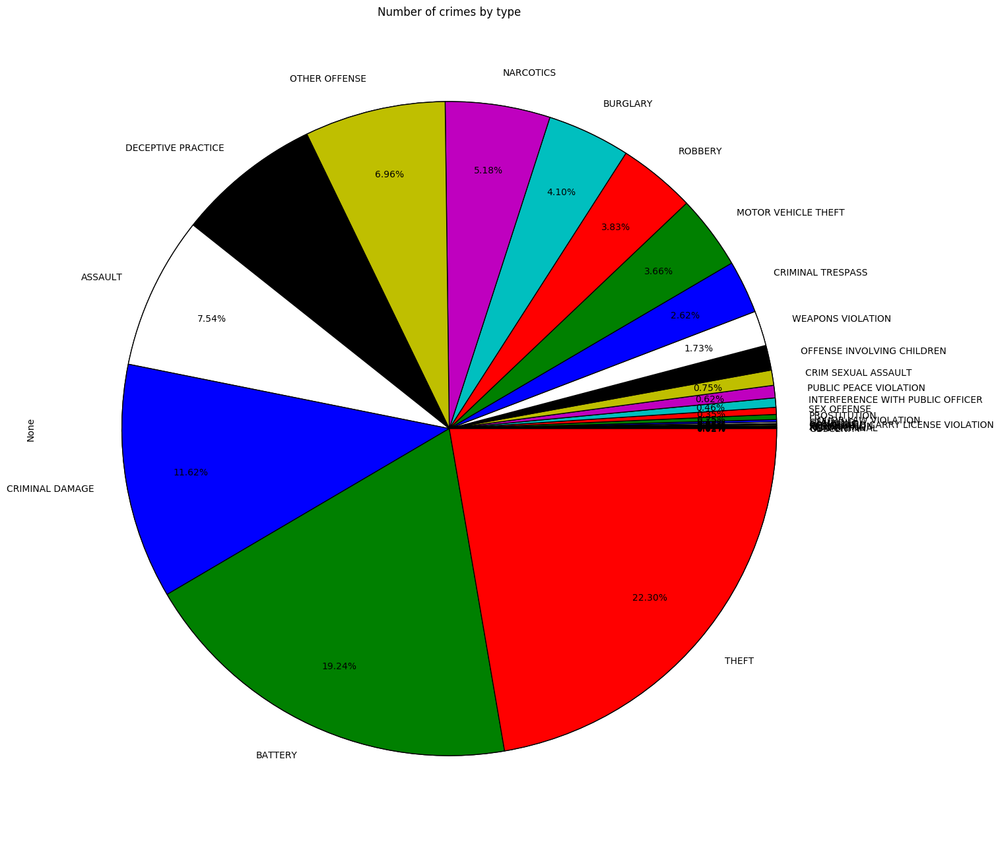

In [77]:
plt.figure(figsize=(16, 16))
tc.groupby([tc['type']]).size().sort_values(ascending=True).plot(kind='pie')
plt.title('Number of crimes by type')
#plt.ylabel('Crime Type')
#plt.xlabel('Number of crimes')
plt.pie(tc.groupby([tc['type']]).size().sort_values(ascending=True),autopct='%.2f%%', pctdistance=.8, labeldistance=100) 
plt.show()